# Preparations

In [2]:
import torch 
import sklearn

import numpy as np 
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib as mpl

from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from pandas import DataFrame

from collections import Counter
from tqdm import tqdm 
from transformers import BertModel, BertTokenizer
from nltk.corpus import stopwords

from matplotlib.pyplot import figure
from matplotlib import collections as mc
from matplotlib.colors import ListedColormap
from matplotlib.colors import LinearSegmentedColormap
from matplotlib.patches import Arc, RegularPolygon
from numpy import radians as rad

In [3]:
import sys
sys.path.append('..')

In [4]:
from data_utils import News20Data

In [6]:
ckpt_path = '../../models/20220428/bertnet_0.0.6.4/ckpt-e8.pt'
ckpt = torch.load(ckpt_path)
state_matrix = ckpt['state_matrix']

In [7]:
def read_state_freq(path):
    state_freq = np.zeros(2000)
    state_nonstop_freq = np.zeros(2000)
    with open(path) as fd:
        lines = fd.readlines()
        for li, l in enumerate(lines):
            if(li % 3 == 0):
                l = l.split()
                state_id = int(l[1])
                state_freq[state_id] = int(l[3])
                state_nonstop_freq[state_id] = int(l[5])
                
    state_freq_norm = np.log(state_freq)
    state_freq_norm = state_freq_norm - state_freq_norm.min()
    state_freq_norm = state_freq_norm / state_freq_norm.max()
    
    state_nonstop_freq_r = state_nonstop_freq / state_freq
    state_freq_idx_sort = state_freq.argsort()[::-1]
    state_freq_idx_inverse = {}
    for i, j in enumerate(state_freq_idx_sort):
        state_freq_idx_inverse[j] = i
    state_stop_freq = state_freq - state_nonstop_freq
    return state_freq_norm, state_nonstop_freq_r, state_freq_idx_sort, state_freq_idx_inverse, state_freq, state_nonstop_freq

In [8]:
state_freq_norm, state_nonstop_freq_r, state_freq_idx_sort, state_freq_idx_inverse, state_freq, state_nonstop_freq = read_state_freq(
    '../../outputs/20220428/bertnet_0.0.6.4/bertnet_dev_epoch_8_s2w.txt')
state_id_sorted_to_origin = state_freq_idx_sort
state_id_origin_to_sorted = state_freq_idx_inverse

In [10]:
len(state_nonstop_freq_r)

2000

In [111]:
def read_state_bigram(path, use_log=True, scale=False):
    bigrams = []
    with open(path) as fd:
        lines = fd.readlines()
        for l in lines:
            if(l.startswith('state 2gram')):
                from_state, to_state = map(int, l.split()[2].split('-'))
                freq = int(l.split()[4])
                bigrams.append([from_state, to_state, freq])
    if(use_log): freq_norm = np.log(np.array([b[2] for b in bigrams])) 
    else: freq_norm = np.array([b[2] for b in bigrams])
    freq_norm = freq_norm - freq_norm.min() + 0.1
    freq_norm /= freq_norm.max()
    freq_norm = np.sqrt(np.sqrt(freq_norm)) # trick
    for bi, fn in zip(bigrams, freq_norm):
        bi.append(fn)
    return bigrams

In [13]:
state_bigrams = read_state_bigram('../../outputs/20220428/bertnet_0.0.6.4/bertnet_dev_epoch_-1_state_2gram_sw.txt', use_log=True, scale=False)

In [14]:
state_bigrams_sw = read_state_bigram('../../outputs/20220428/bertnet_0.0.6.4/bertnet_dev_epoch_-1_state_2gram_no_sw.txt', use_log=True, scale=False)

In [15]:
state_bigrams_all = list(state_bigrams_sw)
state_bigrams_all.extend(state_bigrams)

In [112]:
state_bigrams_both = read_state_bigram('../../outputs/20220428/bertnet_0.0.6.4/bertnet_dev_epoch_-1_state_2gram_both.txt', use_log=True, scale=False)

In [16]:
k = 5
with torch.no_grad():
    sim_state_state = torch.matmul(state_matrix, state_matrix.transpose(0, 1))
    link_values, state_links = sim_state_state.topk(dim=-1, k=k)
    
state_bigram_dot_prod = []
state_links = state_links.cpu().numpy()
link_values = link_values.cpu().numpy()
for i, sl in enumerate(state_links):
    for j in range(k):
        state_bigram_dot_prod.append([i, sl[j], link_values[i, j]])
    
sim_bigram_norm = np.array([bi[-1] for bi in state_bigram_dot_prod])
sim_bigram_norm = np.log(sim_bigram_norm - sim_bigram_norm.min() + 1)
sim_bigram_norm = sim_bigram_norm / sim_bigram_norm.max()
for bi, sb in zip(state_bigram_dot_prod, sim_bigram_norm):
    bi[-1] = sb

In [17]:
target_states = Counter([sb[1] for sb in state_bigram_dot_prod])

In [18]:
top_common = [m[0] for m in target_states.most_common(6)]

In [19]:
def filter_links(state_bigram_dot_prod, k=10):
    target_states = Counter([sb[1] for sb in state_bigram_dot_prod])
    top_common = [m[0] for m in target_states.most_common(k)]
    state_bigram_dot_prod_filtered = [sb for sb in state_bigram_dot_prod if sb[1] not in top_common]
    return state_bigram_dot_prod_filtered

## tSNE

In [20]:
def metric_fn(x1, x2):
    """Hard set metrics between states to be large"""
    m = np.exp(-(x1 * x2).sum())
    return m

def tsne_transform(state_matrix, state_freq_idx_sort, perplexity, n_iter, topk, metric_fn=None):
    """Do tsne"""
    embeddings_vis = state_matrix.cpu().numpy()[state_freq_idx_sort][:topk]

    tsne = TSNE(n_components=2, verbose=2, perplexity=perplexity, n_iter=n_iter, metric=metric_fn)
    emb_transform = tsne.fit_transform(embeddings_vis)
    return emb_transform

def tsne_transform_w_query(state_matrix, queried_links, state_id_sorted_to_origin, state_id_origin_to_sorted, perplexity, n_iter, topk, metric_fn=None):
    """Do tsne"""
    state_id_transformed_to_origin = list(state_id_sorted_to_origin[: topk])
    state_id_origin_to_transformed = {}
    for trans, origin in enumerate(state_id_transformed_to_origin):
        state_id_origin_to_transformed[origin] = trans
    
    added_queried_states = []
    for i, j in queried_links:
        i_ = state_id_origin_to_sorted[i]
        j_ = state_id_origin_to_sorted[j]
        if(i_ >= topk): 
            print('Original state %d rank %d add to transformed list' % (i, i_))
            added_queried_states.append(i)
        if(j_ >= topk): 
            print('Original state %d rank %d add to transformed list' % (j, j_))
            added_queried_states.append(j)
            
    for i, j in enumerate(added_queried_states):
        state_id_transformed_to_origin.append(j)
        state_id_origin_to_transformed[j] = topk + i
    
    embeddings_vis = state_matrix.cpu().numpy()[state_id_transformed_to_origin]

    tsne = TSNE(n_components=2, verbose=2, perplexity=perplexity, n_iter=n_iter, metric=metric_fn)
    emb_transform = tsne.fit_transform(embeddings_vis)
    return emb_transform, state_id_transformed_to_origin, state_id_origin_to_transformed

## Plot

In [126]:
def drawCirc(ax,radius,centX,centY,angle_,theta2_,color_='black'):
    #========Line
    arc = Arc([centX,centY],radius,radius,angle=angle_,
          theta1=0,theta2=theta2_,capstyle='round',linestyle='-.',lw=0.6, color=color_, zorder=4)
    ax.add_patch(arc)


    #========Create the arrow head
    endX=centX+(radius/2)*np.cos(rad(theta2_+angle_)) #Do trig to determine end position
    endY=centY+(radius/2)*np.sin(rad(theta2_+angle_))

    ax.add_patch(                    #Create triangle as arrow head
        RegularPolygon(
            (endX, endY),            # (x,y)
            3,                       # number of vertices
            radius/9,                # radius
            rad(angle_+theta2_),     # orientation
            color=color_,
            zorder=4
        )
    )
    return 

def tsne_vis_state(emb_transform, state_bigrams, state_freq_idx_inverse, state_nonstop_freq_r, state_freq_norm, n_edge, 
                   queried_links=None, state_id_origin_to_transformed=None,
                   line_width=0.5, state_size_base=0.05, query_state_offsets=None,
                   line_alpha=1., state_alpha=1., draw_lines=True, left_colorbar=True, right_colorbar=True, radius=20):
    """Visualize the states"""
    sns.set(rc={'figure.figsize':(8,4), 'figure.dpi': 200})
    plt.rcParams["font.size"] = 3

    fig, ax = plt.subplots(1, 1, constrained_layout=True)
    
    ## Lines
    colors = [[255 / 255., 252 / 255.5, 133 / 255.], # yellow 
              [255 / 255., 252 / 255.5, 138 / 255.], # yellow
              [199 / 255., 255 / 255.5, 185 / 255.], # green 
              [0 / 255., 85 / 255.5, 255 / 255.],
              [0 / 255., 60 / 255.5, 179 / 255.]]
    cmap = LinearSegmentedColormap.from_list('colormap', colors, N=100)
    line_strength = []
    lines = []
    queried_lines = []
    if(draw_lines):
        for bi in state_bigrams[: n_edge]:
            i = state_freq_idx_inverse[bi[0]]
            j = state_freq_idx_inverse[bi[1]]
            a = bi[-1]
            if(i == j): continue
            if(i >= topk): continue
            if(j >= topk): continue

            x1 = emb_transform[i, 0]
            x2 = emb_transform[j, 0]
            y1 = emb_transform[i, 1]
            y2 = emb_transform[j, 1]
            lines.append([(x1, y1), (x2, y2)])
            line_strength.append(a)
        line_colors = cmap(line_strength)
        if(queried_links is not None): line_alpha_ = 0.15
        else: line_alpha_ = line_alpha
        lines = mc.LineCollection(lines, linewidths=line_width, colors=line_colors, alpha=line_alpha_, linestyle='-.', zorder=2)
        pcm = ax.add_collection(lines)
    if(left_colorbar):
        cbar = fig.colorbar(mpl.cm.ScalarMappable(cmap=cmap), location='left', ticks=[0.3, 0.7], shrink=0.8)
        cbar.ax.set_yticklabels(['Weaker transition', 'Stronger transition'], fontsize=15, rotation=270, verticalalignment='center') 

    ## States
    if(queried_links is not None): state_alpha_ = 0.1
    else: state_alpha_ = state_alpha
    plot = ax.scatter(x=emb_transform[:, 0], y=emb_transform[:, 1], c=state_nonstop_freq_r, cmap='Blues', edgecolors='tab:grey', 
                      s=state_size_base * np.exp(np.exp(state_freq_norm)) ** 3, linewidths=0.3, alpha=state_alpha_, zorder=3)

    if(right_colorbar and queried_links is None):
        cbar = fig.colorbar(plot, ticks=[0.2, 0.5, 0.8], shrink=0.8)
        cbar.ax.set_yticklabels(['Static', 'Intermediate', 'Contextualized'], verticalalignment='center', rotation=270, fontsize=15) 
    
    ## Queries
    if(queried_links is not None):
        queried_lines = []
        original_states = []
        self_states_loc = []
        for i, j in queried_links:
            i_ = state_freq_idx_inverse[i]
            j_ = state_freq_idx_inverse[j]
            original_states.append(i)
            original_states.append(j)

            
            if(i != j):
                x1 = emb_transform[i_, 0]
                x2 = emb_transform[j_, 0]
                y1 = emb_transform[i_, 1]
                y2 = emb_transform[j_, 1]
                queried_lines.append([(x1, y1), (x2, y2)])
            else:
                x = emb_transform[i_, 0] - 3
                y = emb_transform[i_, 1]
                self_states_loc.append((x, y))
            
        # lines
        lines = mc.LineCollection(queried_lines, linewidths=1, color=colors[4], alpha=0.8, linestyle='-.', zorder=3)
        ax.add_collection(lines)
#         for li in queried_lines:
#             plt.plot((li[0][0], li[1][0]), (li[0][1], li[1][1]), linewidth=1, color=colors[4], alpha=0.8, linestyle='-.', zorder=3)
        
        # states
        original_states = np.unique(np.array(original_states))
        queried_states = np.array([state_freq_idx_inverse[i] for i in original_states])
        plot=ax.scatter(x=emb_transform[queried_states, 0], y=emb_transform[queried_states, 1], c=state_nonstop_freq_r[queried_states], cmap='Blues', edgecolors='tab:grey', 
                   s=state_size_base * np.exp(np.exp(state_freq_norm[queried_states])) ** 3, linewidths=0.3, alpha=state_alpha, zorder=3)
        cbar = fig.colorbar(plot, ticks=[0.2, 0.5, 0.8], shrink=0.8)
        cbar.ax.set_yticklabels(['Static', 'Intermediate', 'Contextualized'], verticalalignment='center', rotation=270, fontsize=15)
        
        for qsi, osi in zip(queried_states, original_states):
            x_ = emb_transform[qsi, 0] + 2.5
            y_ = emb_transform[qsi, 1] - 3
#             print('Original state %d transformed to %d x %.2f y%.2f' % (osi, qsi, x_, y_))
            if(query_state_offsets is not None):
                if(osi in query_state_offsets):
                    x_ = x_ + query_state_offsets[osi][0]
                    y_ = y_ + query_state_offsets[osi][1]
            plt.text(x=x_, y=y_, s=str(osi), fontsize=15)
    
        # self-looping states
        # for x, y in self_states_loc:
        #     drawCirc(ax, radius, x, y, 0, 330, color_=colors[4])
    
    plt.tick_params(axis='both', which='both', left=False, bottom=False, right=False, top=False, labelleft=False, labelbottom=False) 
    # plt.xlim((-60, 75))
    # plt.ylim((-40, 80))
    return 

# Visualization - All States <- This one is included

In [ ]:
emb_transform_all = np.load('emb_transform_all.npy')

In [101]:
# emb_transform_all = tsne_transform(state_matrix, state_freq_idx_sort, perplexity=5, n_iter=2000, topk=2000, metric_fn=metric_fn)
emb_transform_all = tsne_transform(state_matrix, state_freq_idx_sort, perplexity=5, n_iter=2000, topk=2000, metric_fn='euclidean')

/home/s1946695/miniconda3/envs/_lm_adaptation_dev/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/home/s1946695/miniconda3/envs/_lm_adaptation_dev/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


[t-SNE] Computing 16 nearest neighbors...
[t-SNE] Indexed 2000 samples in 0.002s...
[t-SNE] Computed neighbors for 2000 samples in 0.296s...
[t-SNE] Computed conditional probabilities for sample 1000 / 2000
[t-SNE] Computed conditional probabilities for sample 2000 / 2000
[t-SNE] Mean sigma: 0.092128
[t-SNE] Computed conditional probabilities in 0.040s
[t-SNE] Iteration 50: error = 120.9040680, gradient norm = 0.2397583 (50 iterations in 0.832s)
[t-SNE] Iteration 100: error = 124.4736328, gradient norm = 0.2144525 (50 iterations in 0.755s)
[t-SNE] Iteration 150: error = 123.8916092, gradient norm = 0.1889617 (50 iterations in 0.842s)
[t-SNE] Iteration 200: error = 124.5861816, gradient norm = 0.1639815 (50 iterations in 0.639s)
[t-SNE] Iteration 250: error = 115.8467560, gradient norm = 0.4659903 (50 iterations in 0.646s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 115.846756
[t-SNE] Iteration 300: error = 3.8663549, gradient norm = 0.0050052 (50 iterations in 0

In [137]:
np.save('emb_transform_all.npy', emb_transform_all)

/home/s1946695/miniconda3/envs/_lm_adaptation_dev/lib/python3.7/site-packages/ipykernel_launcher.py:75: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.


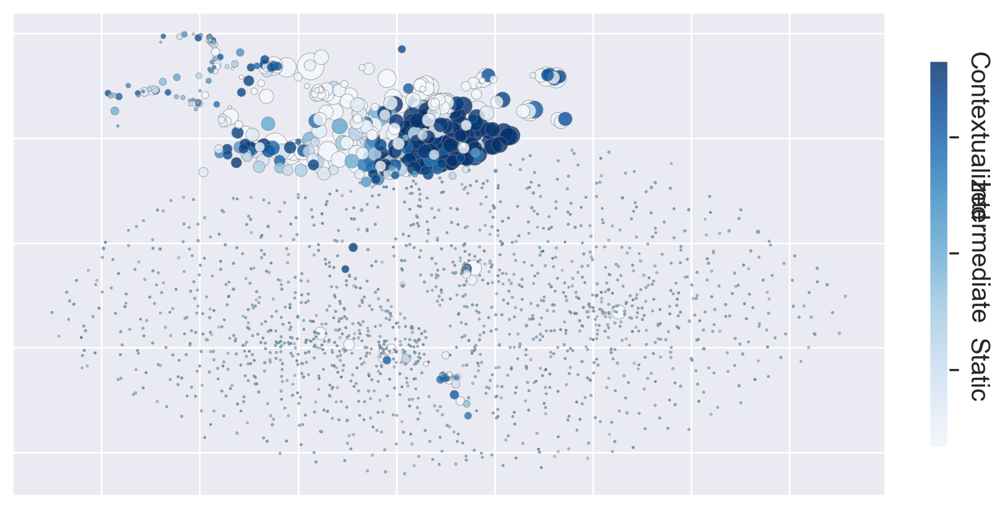

In [73]:
state_nonstop_freq_r_ = state_nonstop_freq_r[state_freq_idx_sort][: 2000]
state_freq_norm_ = state_freq_norm[state_freq_idx_sort][: 2000]
tsne_vis_state(emb_transform, state_bigram_dot_prod, state_freq_idx_inverse, state_nonstop_freq_r_, state_freq_norm_, line_width=0.7,
               state_size_base=0.07,
               n_edge=30000, line_alpha=0.5, state_alpha=0.8, draw_lines=False, left_colorbar=False)

/home/s1946695/miniconda3/envs/_lm_adaptation_dev/lib/python3.7/site-packages/ipykernel_launcher.py:65: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.


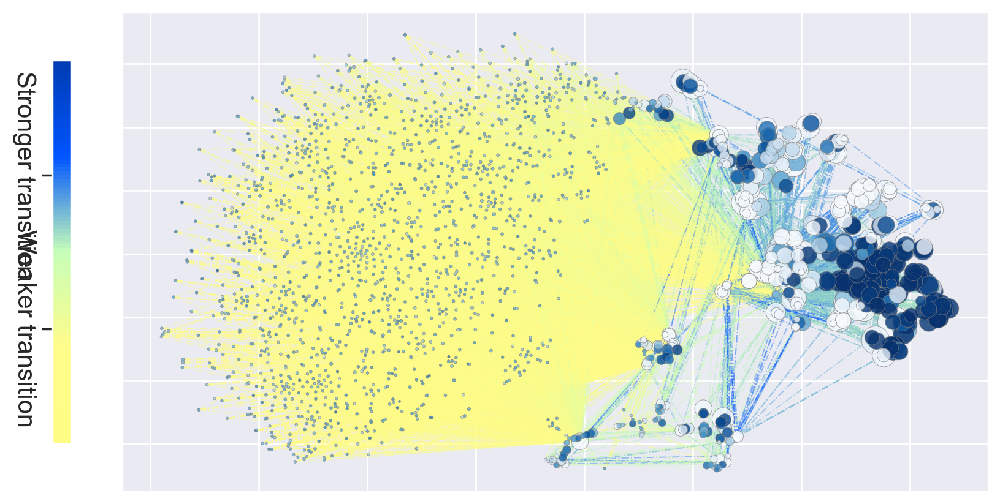

In [102]:
state_nonstop_freq_r_all = state_nonstop_freq_r[state_freq_idx_sort][: 2000]
state_freq_norm_all = state_freq_norm[state_freq_idx_sort][: 2000]
_ = tsne_vis_state(emb_transform_all, state_bigram_dot_prod, state_freq_idx_inverse, state_nonstop_freq_r_all, state_freq_norm_all, line_width=0.7,
                   state_size_base=0.1,
               n_edge=10000, line_alpha=0.5, state_alpha=0.8, draw_lines=True, left_colorbar=True, right_colorbar=False)

# Visualization - topk

## PPL = 5

### Dot Prod

In [93]:
topk=2000
state_nonstop_freq_r_ = state_nonstop_freq_r[state_freq_idx_sort][: topk]
state_freq_norm_ = state_freq_norm[state_freq_idx_sort][: topk]

In [94]:
emb_transform = tsne_transform(state_matrix, state_freq_idx_sort, perplexity=5, n_iter=2000, topk=topk, metric_fn=metric_fn)

/home/s1946695/miniconda3/envs/_lm_adaptation_dev/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/home/s1946695/miniconda3/envs/_lm_adaptation_dev/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,
/home/s1946695/miniconda3/envs/_lm_adaptation_dev/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:827: FutureWarning: 'square_distances' has been introduced in 0.24 to help phase out legacy squaring behavior. The 'legacy' setting will be removed in 1.1 (renaming of 0.26), and the default setting will be changed to True. In 1.3, 'square_distances' will be removed altogether, and distances will be squared by default. Set 'square_distances'=True to silence this warning.
  FutureWarning,


[t-SNE] Computing 16 nearest neighbors...
[t-SNE] Indexed 2000 samples in 0.002s...
[t-SNE] Computed neighbors for 2000 samples in 16.489s...
[t-SNE] Computed conditional probabilities for sample 1000 / 2000
[t-SNE] Computed conditional probabilities for sample 2000 / 2000
[t-SNE] Mean sigma: 0.000007
[t-SNE] Computed conditional probabilities in 0.023s
[t-SNE] Iteration 50: error = 158.3463745, gradient norm = 0.2333007 (50 iterations in 0.572s)
[t-SNE] Iteration 100: error = 160.7577362, gradient norm = 0.2174868 (50 iterations in 0.609s)
[t-SNE] Iteration 150: error = 160.2588501, gradient norm = 0.2695318 (50 iterations in 0.603s)
[t-SNE] Iteration 200: error = 164.1009674, gradient norm = 0.3246451 (50 iterations in 1.147s)
[t-SNE] Iteration 250: error = 174.3719940, gradient norm = 0.2278280 (50 iterations in 1.240s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 174.371994
[t-SNE] Iteration 300: error = 7.6662979, gradient norm = 0.0125589 (50 iterations in 

#### Posterior Links

/home/s1946695/miniconda3/envs/_lm_adaptation_dev/lib/python3.7/site-packages/ipykernel_launcher.py:65: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
/home/s1946695/miniconda3/envs/_lm_adaptation_dev/lib/python3.7/site-packages/ipykernel_launcher.py:75: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.


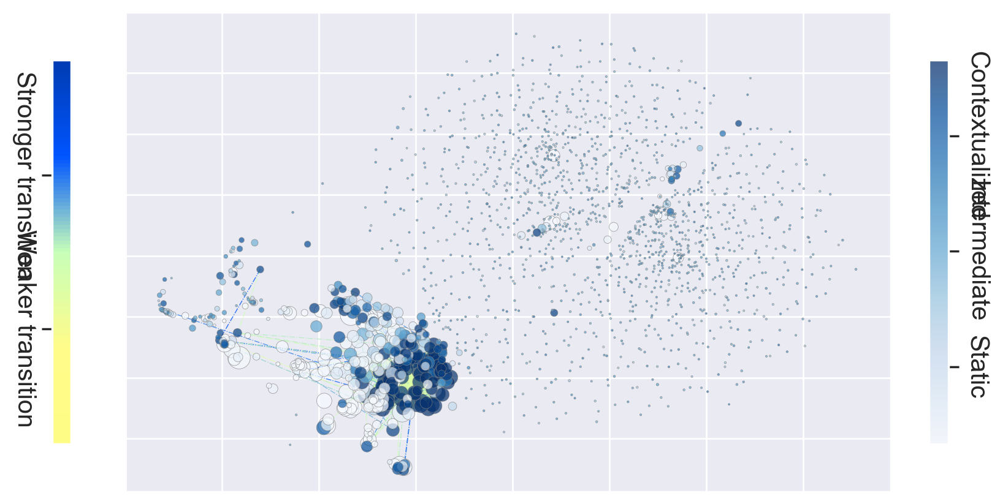

In [76]:
tsne_vis_state(emb_transform, state_bigrams_all, state_freq_idx_inverse, state_nonstop_freq_r_, state_freq_norm_, n_edge=2000, line_alpha=0.8,
               state_alpha=0.7, draw_lines=True)

#### Dot prod links

/home/s1946695/miniconda3/envs/_lm_adaptation_dev/lib/python3.7/site-packages/ipykernel_launcher.py:65: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
/home/s1946695/miniconda3/envs/_lm_adaptation_dev/lib/python3.7/site-packages/ipykernel_launcher.py:75: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.


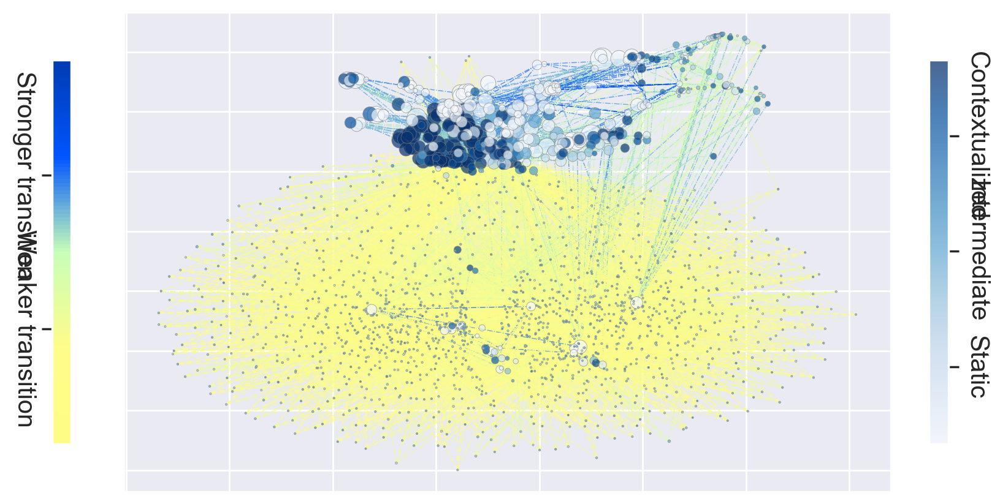

In [96]:
tsne_vis_state(emb_transform, state_bigram_dot_prod, state_freq_idx_inverse, state_nonstop_freq_r_, state_freq_norm_, n_edge=10000, line_alpha=0.8,
               state_alpha=0.7, draw_lines=True)

### Euclidean <- I decide to use this one

In [105]:
topk=500
state_nonstop_freq_r_ = state_nonstop_freq_r[state_freq_idx_sort[: topk]]
state_freq_norm_ = state_freq_norm[state_freq_idx_sort[: topk]]

/home/s1946695/miniconda3/envs/_lm_adaptation_dev/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/home/s1946695/miniconda3/envs/_lm_adaptation_dev/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


[t-SNE] Computing 16 nearest neighbors...
[t-SNE] Indexed 500 samples in 0.001s...
[t-SNE] Computed neighbors for 500 samples in 0.029s...
[t-SNE] Computed conditional probabilities for sample 500 / 500
[t-SNE] Mean sigma: 0.547451
[t-SNE] Computed conditional probabilities in 0.010s
[t-SNE] Iteration 50: error = 86.3568726, gradient norm = 0.4706626 (50 iterations in 0.190s)
[t-SNE] Iteration 100: error = 83.7156982, gradient norm = 0.4860969 (50 iterations in 0.150s)
[t-SNE] Iteration 150: error = 83.1349716, gradient norm = 0.4778964 (50 iterations in 0.193s)
[t-SNE] Iteration 200: error = 83.2890625, gradient norm = 0.4505512 (50 iterations in 0.151s)
[t-SNE] Iteration 250: error = 82.4434357, gradient norm = 0.4818127 (50 iterations in 0.136s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 82.443436
[t-SNE] Iteration 300: error = 1.3665688, gradient norm = 0.0048962 (50 iterations in 0.106s)
[t-SNE] Iteration 350: error = 1.1961679, gradient norm = 0.0015733 (

In [138]:
emb_transform = np.load('emb_transform.npy')
# emb_transform = tsne_transform(state_matrix, state_freq_idx_sort, perplexity=5, n_iter=2000, topk=topk, metric_fn='euclidean')
# np.save('emb_transform.npy', emb_transform)

#### Links with Aggregated Posterior

/home/s1946695/miniconda3/envs/_lm_adaptation_dev/lib/python3.7/site-packages/ipykernel_launcher.py:75: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.


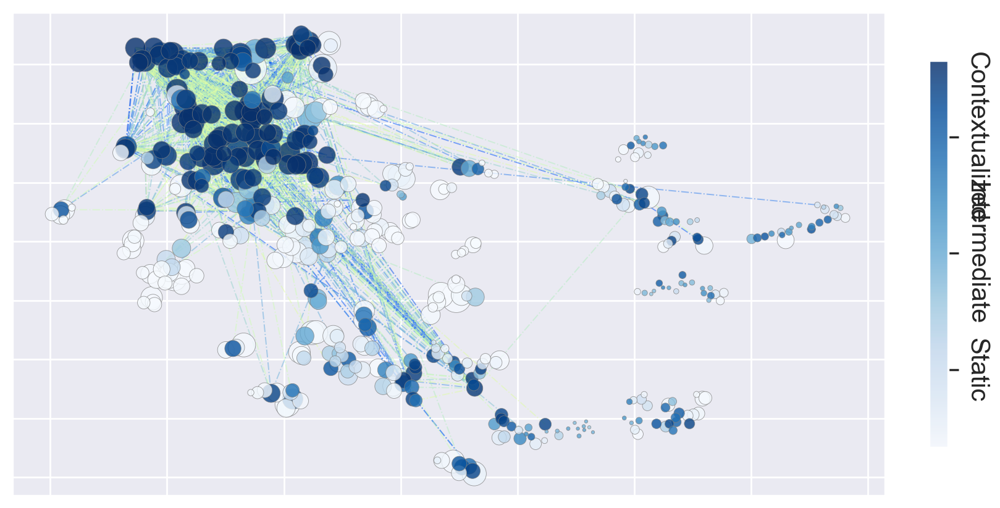

In [114]:
tsne_vis_state(emb_transform, state_bigrams_all, state_freq_idx_inverse, state_nonstop_freq_r_, state_freq_norm_, line_width=0.7,
               state_size_base=0.1,
               n_edge=2000, line_alpha=0.5, state_alpha=0.8, draw_lines=True, left_colorbar=False)

#### Query Special States

/home/s1946695/miniconda3/envs/_lm_adaptation_dev/lib/python3.7/site-packages/ipykernel_launcher.py:112: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.


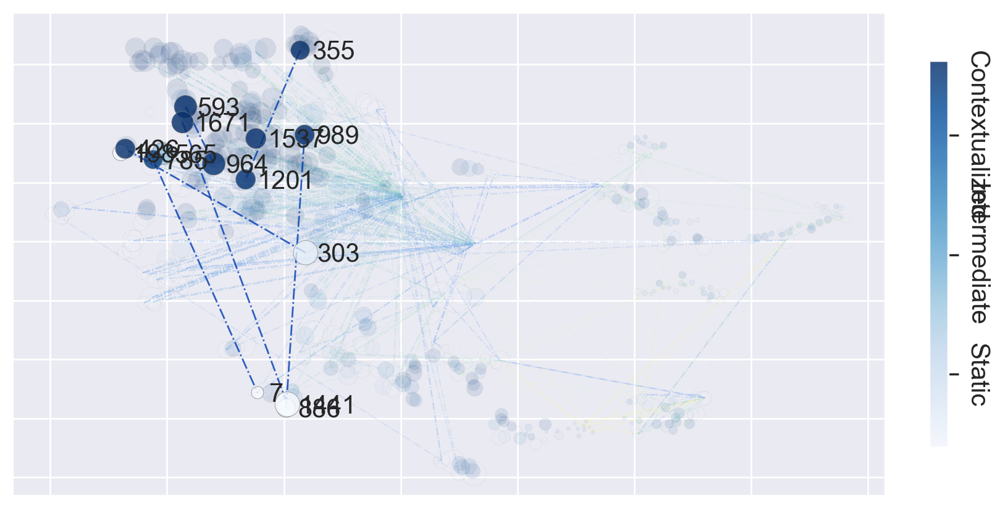

In [136]:
queried_links = [
    # (886, 1424),
    # (886, 1011),
    (886, 989),
    (1671, 1441),
    (785, 7),
    (426, 198),
    (303, 426),
    (785, 565),
    # (1707, 886),
    # (1707, 1441),
    # (544, 1296),
    # (1154, 872),
    (355, 1201),
    # (574, 574),
    (1537, 1537),
    (593, 964),
    ]
# query_state_offsets = {1843: (-13, 3), 698: (-12, -3), 1712: (-4, 6), 979: (-12, 2), 192: (-1, 0), 1064: (-1, -2), 1572: (-0.5, 0),
#                        254: (0, -2), 145: (-10, -5), 904: (0, 3), 1895: (-1, 0), 243: (-12, 0), 296: (-6, 7), 476: (-13, 1),
#                        1654: (-6, 6), 1556: (-1, -2.5), 982: (-11, 6), 1865: (-2, 5)
#                       }
query_state_offsets = None

tsne_vis_state(emb_transform, state_bigram_dot_prod, state_freq_idx_inverse, state_nonstop_freq_r_, state_freq_norm_, line_width=0.7,
               query_state_offsets=query_state_offsets,
               state_size_base=0.1, queried_links=queried_links, state_id_origin_to_transformed=state_id_origin_to_sorted,
               n_edge=2000, line_alpha=0.5, state_alpha=0.8, draw_lines=True, left_colorbar=False)

#### Dot Prod links

/home/s1946695/miniconda3/envs/_lm_adaptation_dev/lib/python3.7/site-packages/ipykernel_launcher.py:65: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.


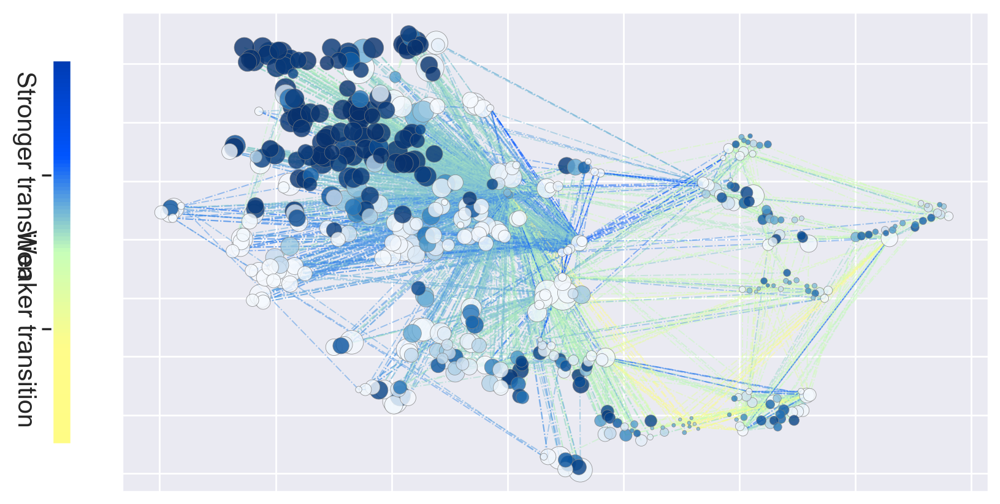

In [106]:
# state_bigram_dot_prod_filtered = filter_links(state_bigram_dot_prod, k=10)
_ = tsne_vis_state(emb_transform, state_bigram_dot_prod, state_freq_idx_inverse, state_nonstop_freq_r_, state_freq_norm_, line_width=0.7,
                   state_size_base=0.1,
               n_edge=10000, line_alpha=0.5, state_alpha=0.8, draw_lines=True, left_colorbar=True, right_colorbar=False)

#### Plot

## PPL = 30

### Dot Prod

In [305]:
emb_transform = tsne_transform(state_matrix, state_freq_idx_sort, perplexity=30, n_iter=2000, topk=topk, metric_fn=metric_fn)

/home/s1946695/miniconda3/envs/_dl_py36_dev/lib/python3.6/site-packages/sklearn/manifold/_t_sne.py:699: FutureWarning: 'square_distances' has been introduced in 0.24 to help phase out legacy squaring behavior. The 'legacy' setting will be removed in 1.1 (renaming of 0.26), and the default setting will be changed to True. In 1.3, 'square_distances' will be removed altogether, and distances will be squared by default. Set 'square_distances'=True to silence this warning.
  FutureWarning


[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 500 samples in 0.001s...
[t-SNE] Computed neighbors for 500 samples in 1.745s...
[t-SNE] Computed conditional probabilities for sample 500 / 500
[t-SNE] Mean sigma: 0.000130
[t-SNE] Computed conditional probabilities in 0.066s
[t-SNE] Iteration 50: error = 107.6786270, gradient norm = 0.2677940 (50 iterations in 0.332s)
[t-SNE] Iteration 100: error = 110.4075546, gradient norm = 0.2791936 (50 iterations in 0.327s)
[t-SNE] Iteration 150: error = 114.0883942, gradient norm = 0.2402134 (50 iterations in 0.322s)
[t-SNE] Iteration 200: error = 116.8707428, gradient norm = 0.2417458 (50 iterations in 0.357s)
[t-SNE] Iteration 250: error = 120.1961899, gradient norm = 0.2653398 (50 iterations in 0.369s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 120.196190
[t-SNE] Iteration 300: error = 3.4878128, gradient norm = 0.0049117 (50 iterations in 0.337s)
[t-SNE] Iteration 350: error = 2.8895154, gradient norm = 0.001

#### Posterior Links

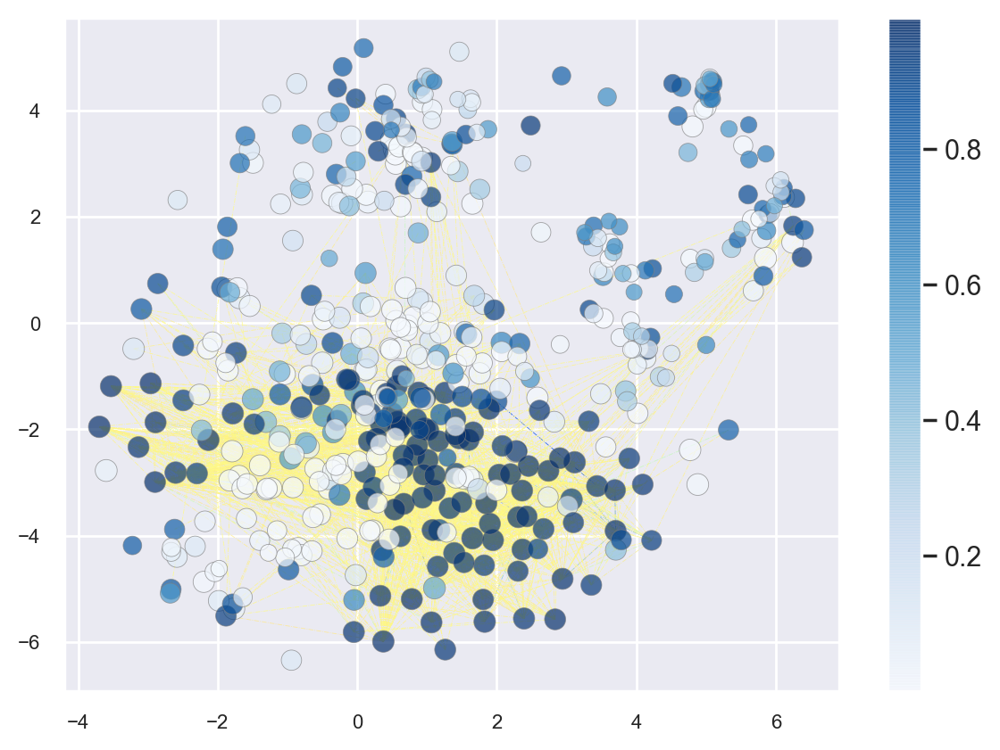

In [306]:
tsne_vis_state(emb_transform, state_bigrams, state_freq_idx_inverse, state_nonstop_freq_r_, state_freq_norm_, n_edge=2000, line_alpha=0.8,
               state_alpha=0.7, draw_lines=True)

#### Dot Prod Links

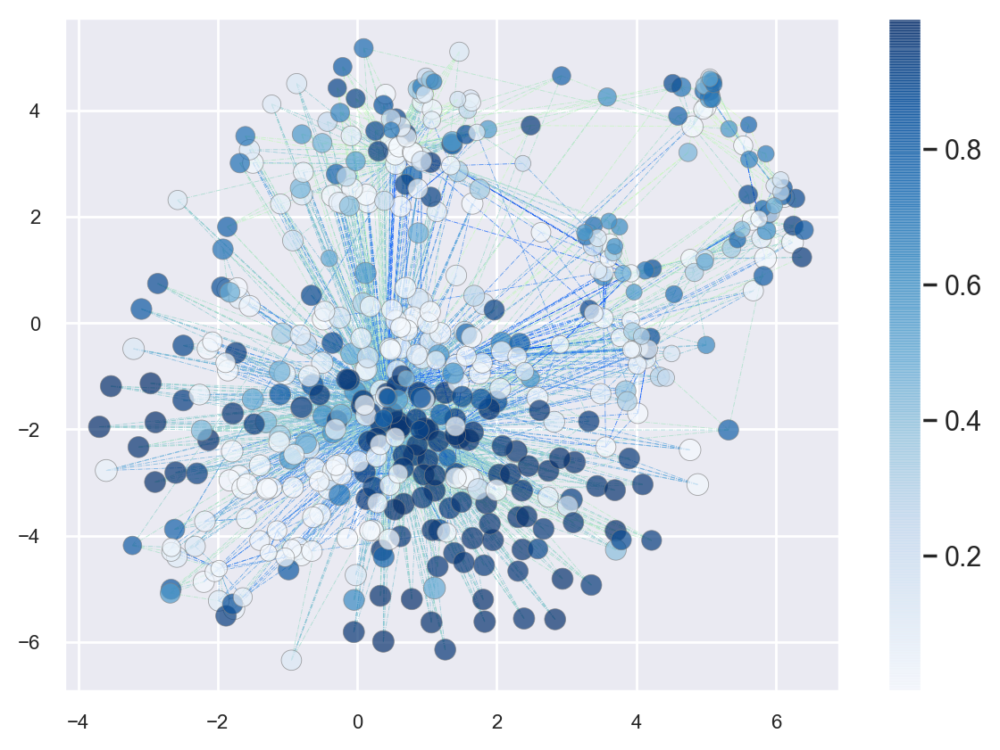

In [309]:
tsne_vis_state(emb_transform, state_bigram_dot_prod, state_freq_idx_inverse, state_nonstop_freq_r_, state_freq_norm_, n_edge=10000, 
               line_alpha=0.8,
               state_alpha=0.7, draw_lines=True)

### Euclidean

In [332]:
emb_transform = tsne_transform(state_matrix, state_freq_idx_sort, perplexity=30, n_iter=2000, topk=topk, metric_fn='euclidean')

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 500 samples in 0.001s...
[t-SNE] Computed neighbors for 500 samples in 0.040s...
[t-SNE] Computed conditional probabilities for sample 500 / 500
[t-SNE] Mean sigma: 0.882674
[t-SNE] Computed conditional probabilities in 0.039s
[t-SNE] Iteration 50: error = 69.5076294, gradient norm = 0.4567234 (50 iterations in 0.337s)
[t-SNE] Iteration 100: error = 69.4067612, gradient norm = 0.4888991 (50 iterations in 0.355s)
[t-SNE] Iteration 150: error = 69.8269577, gradient norm = 0.4700390 (50 iterations in 0.331s)
[t-SNE] Iteration 200: error = 71.6957550, gradient norm = 0.4679599 (50 iterations in 0.377s)
[t-SNE] Iteration 250: error = 70.8447723, gradient norm = 0.4726992 (50 iterations in 0.364s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 70.844772
[t-SNE] Iteration 300: error = 0.8899909, gradient norm = 0.0035683 (50 iterations in 0.314s)
[t-SNE] Iteration 350: error = 0.8323193, gradient norm = 0.0006716 (

#### Posterior Links

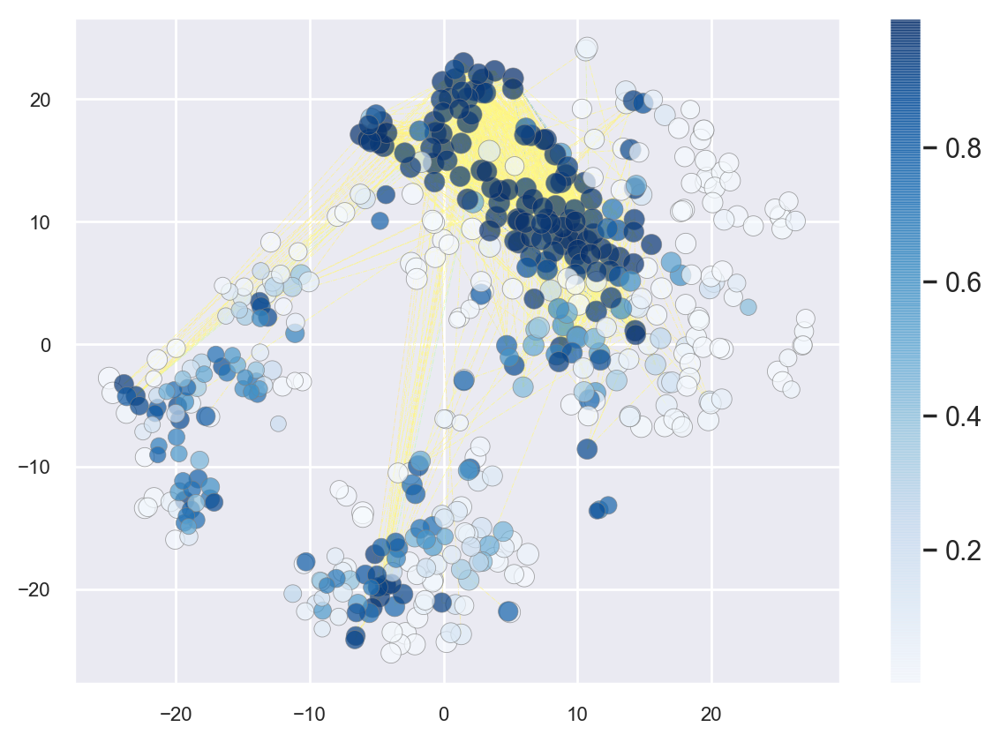

In [311]:
tsne_vis_state(emb_transform, state_bigrams, state_freq_idx_inverse, state_nonstop_freq_r_, state_freq_norm_, n_edge=2000, line_alpha=0.8,
               state_alpha=0.7, draw_lines=True)

#### Dot Prod Links

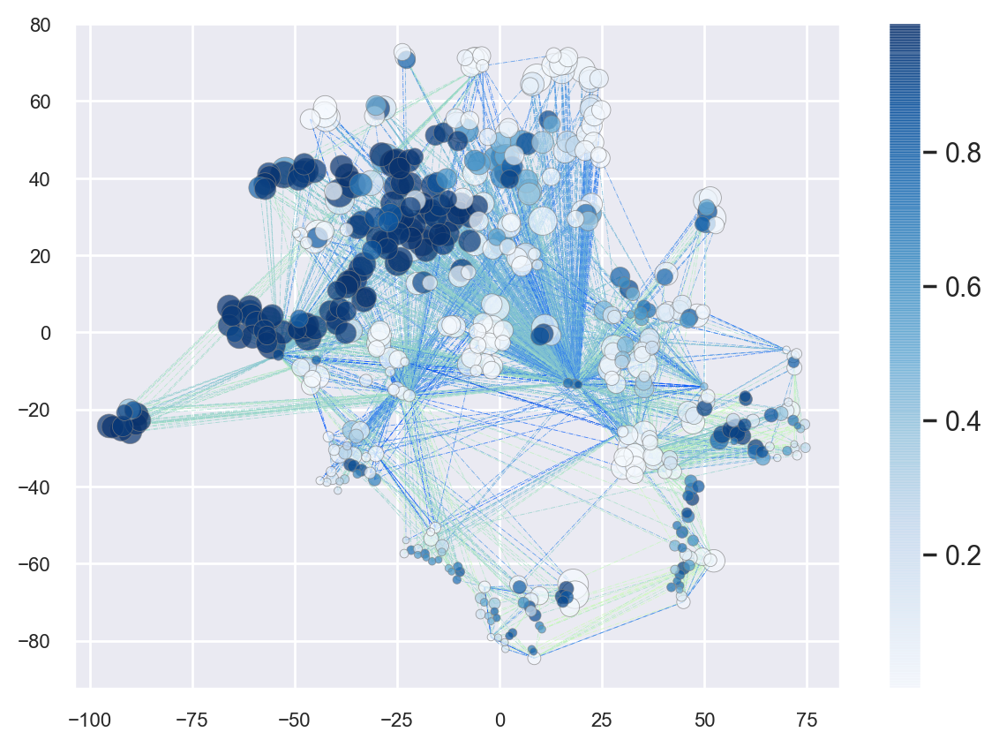

In [344]:
tsne_vis_state(emb_transform, state_bigram_dot_prod, state_freq_idx_inverse, state_nonstop_freq_r_, state_freq_norm_, n_edge=10000, line_alpha=0.8,
               state_alpha=0.7, draw_lines=True)

## PPL = 50

### Dot Prod

In [291]:
emb_transform = tsne_transform(state_matrix, state_freq_idx_sort, perplexity=50, n_iter=2000, topk=topk, metric_fn=metric_fn)

/home/s1946695/miniconda3/envs/_dl_py36_dev/lib/python3.6/site-packages/sklearn/manifold/_t_sne.py:699: FutureWarning: 'square_distances' has been introduced in 0.24 to help phase out legacy squaring behavior. The 'legacy' setting will be removed in 1.1 (renaming of 0.26), and the default setting will be changed to True. In 1.3, 'square_distances' will be removed altogether, and distances will be squared by default. Set 'square_distances'=True to silence this warning.
  FutureWarning


[t-SNE] Computing 151 nearest neighbors...
[t-SNE] Indexed 500 samples in 0.001s...
[t-SNE] Computed neighbors for 500 samples in 1.738s...
[t-SNE] Computed conditional probabilities for sample 500 / 500
[t-SNE] Mean sigma: 0.000258
[t-SNE] Computed conditional probabilities in 0.105s
[t-SNE] Iteration 50: error = 97.7277069, gradient norm = 0.2513944 (50 iterations in 0.372s)
[t-SNE] Iteration 100: error = 101.6083374, gradient norm = 0.2446636 (50 iterations in 0.397s)
[t-SNE] Iteration 150: error = 103.7091141, gradient norm = 0.2586506 (50 iterations in 0.389s)
[t-SNE] Iteration 200: error = 104.4788132, gradient norm = 0.3392102 (50 iterations in 0.374s)
[t-SNE] Iteration 250: error = 109.4316101, gradient norm = 0.2326428 (50 iterations in 0.364s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 109.431610
[t-SNE] Iteration 300: error = 2.3398452, gradient norm = 0.0054107 (50 iterations in 0.383s)
[t-SNE] Iteration 350: error = 1.8877336, gradient norm = 0.002

#### Posterior Links

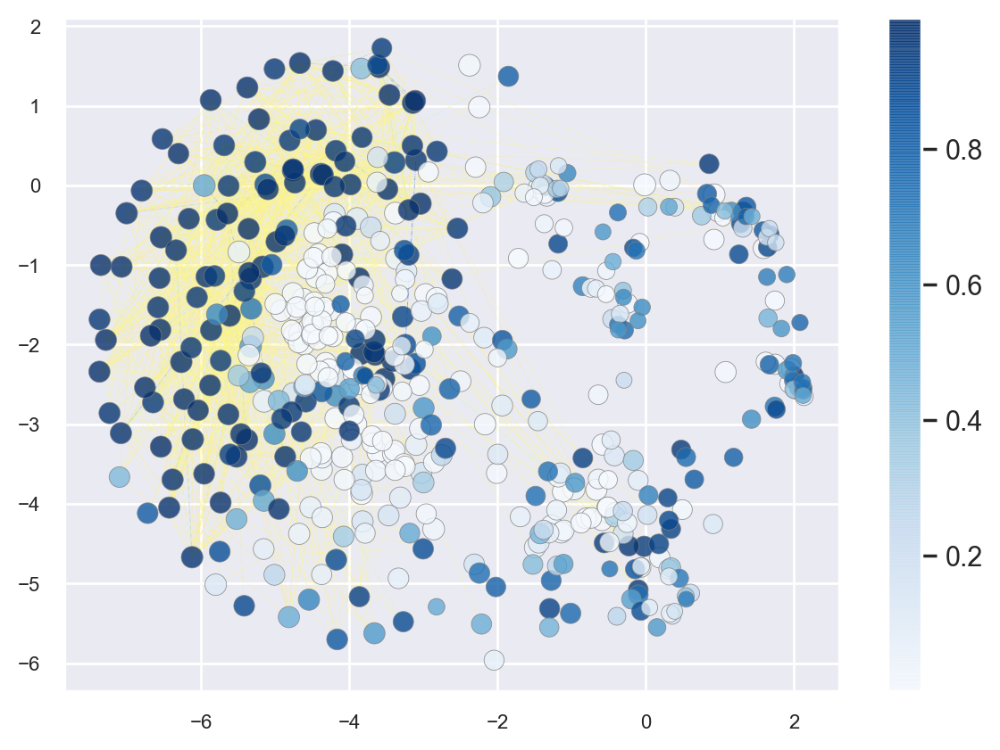

In [292]:
tsne_vis_state(emb_transform, state_bigrams, state_freq_idx_inverse, state_nonstop_freq_r_, state_freq_norm_, n_edge=2000, line_alpha=0.5, state_alpha=0.8, draw_lines=True)

#### Dot Prod Links

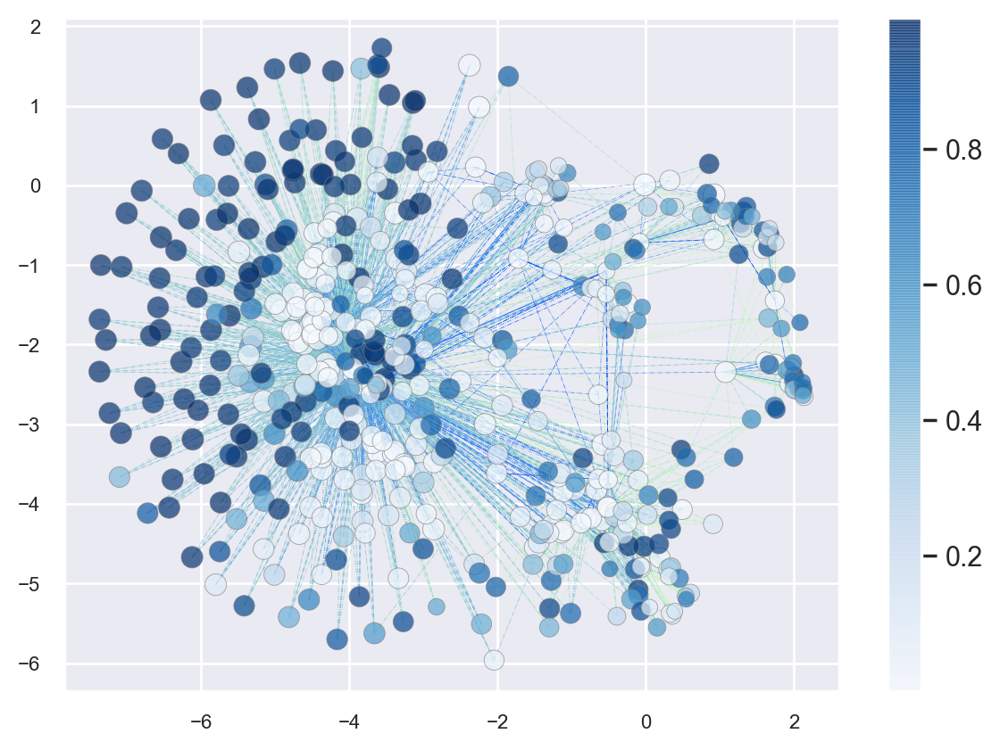

In [293]:
tsne_vis_state(emb_transform, state_bigram_dot_prod, state_freq_idx_inverse, state_nonstop_freq_r_, state_freq_norm_, n_edge=10000, 
               line_alpha=0.8,
               state_alpha=0.7, draw_lines=True)

#### Dot Prod Filtered

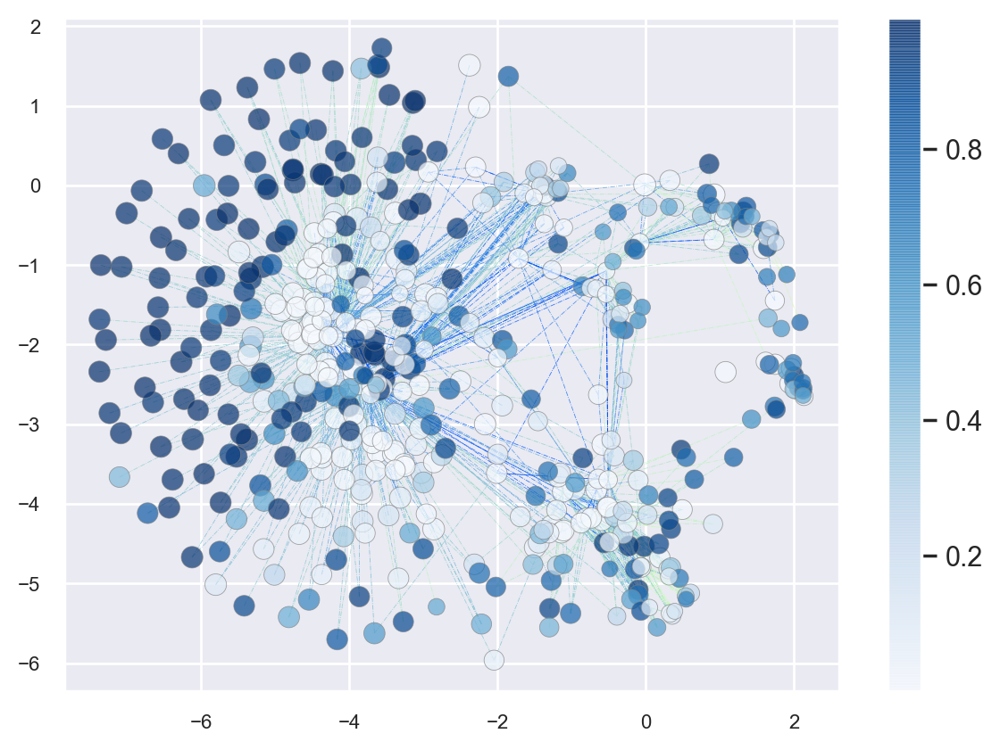

In [294]:
state_bigram_dot_prod_filtered = filter_links(state_bigram_dot_prod, k=10)
tsne_vis_state(emb_transform, state_bigram_dot_prod_filtered, state_freq_idx_inverse, state_nonstop_freq_r_, state_freq_norm_, n_edge=10000, line_alpha=0.8,
               state_alpha=0.7, draw_lines=True)

### Euclidean Distance

In [295]:
emb_transform = tsne_transform(state_matrix, state_freq_idx_sort, perplexity=50, n_iter=2000, topk=topk, metric_fn='euclidean')

[t-SNE] Computing 151 nearest neighbors...
[t-SNE] Indexed 500 samples in 0.002s...
[t-SNE] Computed neighbors for 500 samples in 0.042s...
[t-SNE] Computed conditional probabilities for sample 500 / 500
[t-SNE] Mean sigma: 0.981745
[t-SNE] Computed conditional probabilities in 0.064s
[t-SNE] Iteration 50: error = 65.9366531, gradient norm = 0.4735738 (50 iterations in 0.397s)
[t-SNE] Iteration 100: error = 69.4625168, gradient norm = 0.4218435 (50 iterations in 0.412s)
[t-SNE] Iteration 150: error = 68.7669296, gradient norm = 0.4455425 (50 iterations in 0.417s)
[t-SNE] Iteration 200: error = 67.8232193, gradient norm = 0.4391150 (50 iterations in 0.432s)
[t-SNE] Iteration 250: error = 68.0372772, gradient norm = 0.4369984 (50 iterations in 0.418s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 68.037277
[t-SNE] Iteration 300: error = 0.6968644, gradient norm = 0.0033067 (50 iterations in 0.314s)
[t-SNE] Iteration 350: error = 0.6543899, gradient norm = 0.0008820 

#### Posterior Links

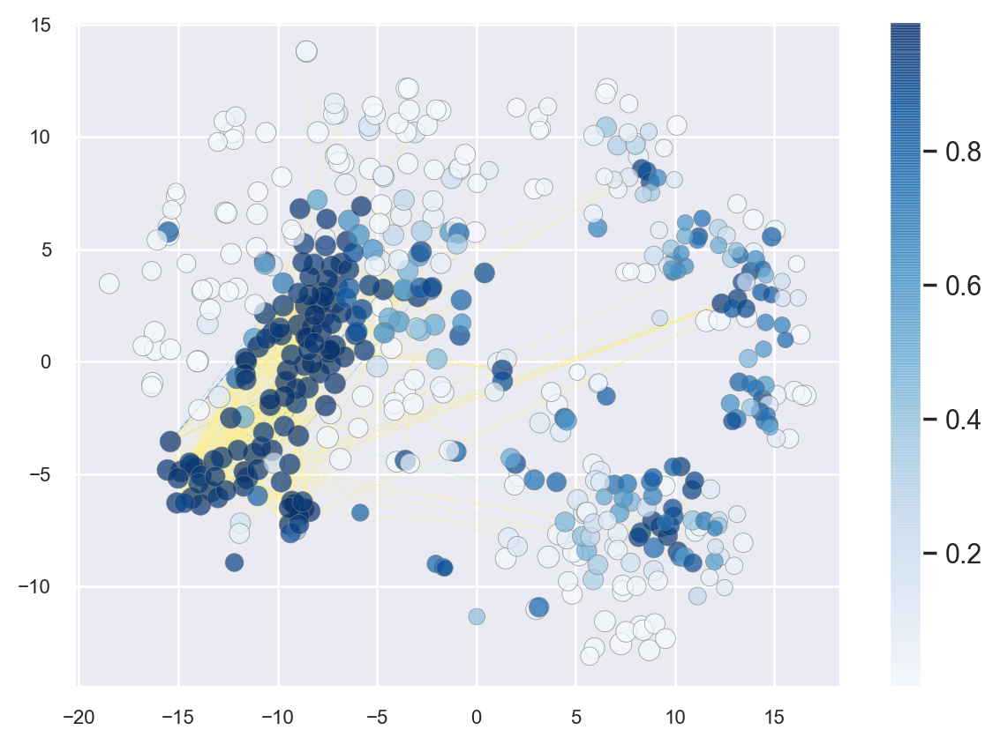

In [297]:
tsne_vis_state(emb_transform, state_bigrams, state_freq_idx_inverse, state_nonstop_freq_r_, state_freq_norm_, n_edge=1000, line_alpha=0.8,
               state_alpha=0.7, draw_lines=True)

#### Dot Prod Links

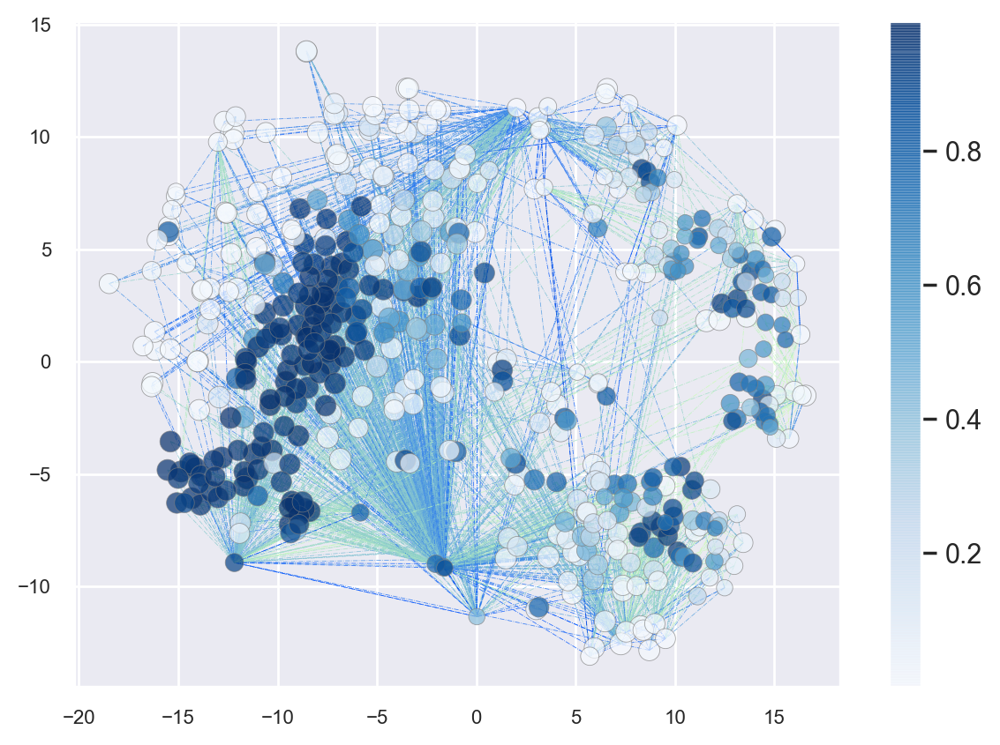

In [298]:
tsne_vis_state(emb_transform, state_bigram_dot_prod, state_freq_idx_inverse, state_nonstop_freq_r_, state_freq_norm_, n_edge=10000, line_alpha=0.8,
               state_alpha=0.7, draw_lines=True)